In [15]:
import pandas as pd
import plotly.express as px

In [15]:
airbnb_ny_df = pd.read_csv("AB_NYC_2019.csv")
airbnb_ny_df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [21]:
#finding missing values
missing_values = airbnb_ny_df.isnull().sum()
print("missing values in each column:")
print(missing_values)

missing values in each column:
id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64


In [27]:
airbnb_ny_cleaned = airbnb_ny_df.dropna(subset=['name','host_name','last_review','reviews_per_month'])
airbnb_ny_cleaned.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
5,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,2019-06-22,0.59,1,129


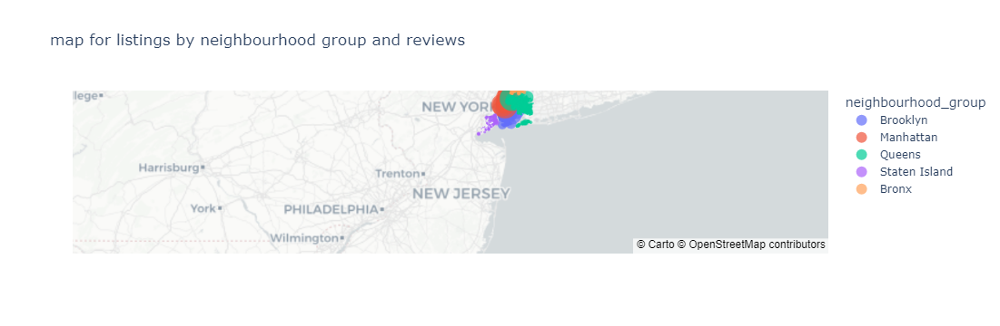

In [45]:
fig = px.scatter_mapbox(airbnb_ny_cleaned, lat='latitude', lon='longitude', color='neighbourhood_group', size = 'price',
                        title= 'map for listings by neighbourhood group and reviews',
                        mapbox_style= "carto-positron",
                        center = {'lat':40.7128, 'lon':-74.0060},
                        zoom=10)
fig.show()
                        
                    
        

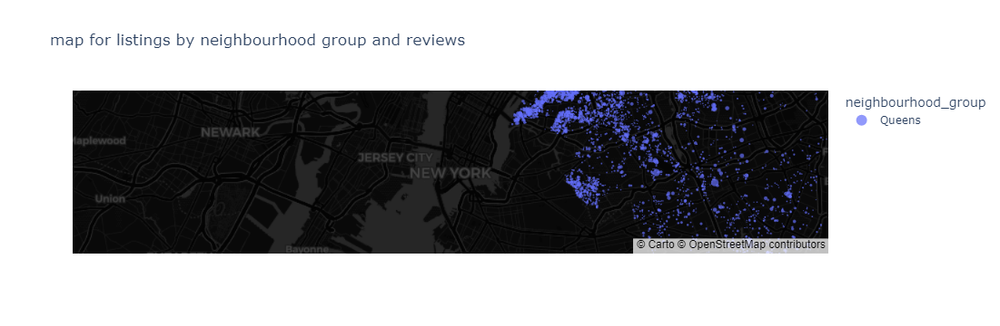

In [49]:
df_queens = airbnb_ny_cleaned[airbnb_ny_cleaned['neighbourhood_group']=='Queens']

fig = px.scatter_mapbox(df_queens, lat='latitude', lon='longitude',
                        color='neighbourhood_group', size= 'price',
                        title='map for listings by neighbourhood group and reviews',
                        mapbox_style = "carto-darkmatter",
                        center = {'lat':40.7128, 'lon':-74.0060},
                        zoom=10)
fig.show()

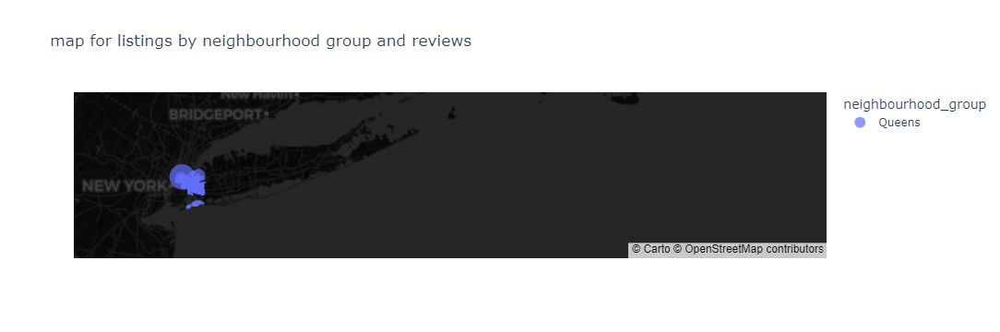

ValueError: Invalid property specified for object of type plotly.graph_objs.layout.mapbox.Center: 'lst'

Did you mean "lat"?

    Valid properties:
        lat
            Sets the latitude of the center of the map (in degrees
            North).
        lon
            Sets the longitude of the center of the map (in degrees
            East).
        
Did you mean "lat"?

Bad property path:
lst
^^^

In [63]:
def create_map_for_room_type(room_type):
    df_room_type = df_queens[df_queens['room_type']==room_type]

    fig = px.scatter_mapbox(
        
         
     df_room_type,
        lat='latitude', 
        lon='longitude',
        color='neighbourhood',
         size= 'price',
         hover_name='name',
         hover_data={
            'price':True,
             'room_type':True,
             'number_of_reviews':True,
             'availability_365':True},
         title=f'map of {room_type}s in Queens by neighbourhood and price',
         mapbox_style= "carto-darkmatter",
         center = {'lst':40.7128, 'lon':-74.0060},
        zoom=10,
size_max=15)

fig.show()

room_types = df_queens['room_type'].unique()
for room_type in room_types:
     create_map_for_room_type(room_type)
    


## presentation 4

In [68]:
import pandas as pd
import plotly.express as px

In [86]:
SP = pd.read_csv("s&p.csv",header=1)
SP.head

<bound method NDFrame.head of        Year  S&P 500  Dividends Dividend Yield T.Bond rate Return on bond  \
0    1927.0    17.66       0.62          3.50%       3.17%            NaN   
1    1928.0    24.35       1.05          4.30%       3.45%          0.84%   
2    1929.0    21.45       0.88          4.10%       3.36%          4.20%   
3    1930.0    15.34       0.72          4.70%       3.22%          4.54%   
4    1931.0     8.12       0.50          6.10%       3.93%         -2.56%   
..      ...      ...        ...            ...         ...            ...   
175     NaN      NaN        NaN            NaN         NaN            NaN   
176     NaN      NaN        NaN            NaN         NaN            NaN   
177     NaN      NaN        NaN            NaN         NaN            NaN   
178     NaN      NaN        NaN            NaN         NaN            NaN   
179     NaN      NaN        NaN            NaN         NaN            NaN   

    Aaa Bond Rate Return on Aaa  Baa Bond Rat

In [88]:
SP = SP.drop(columns="Unnamed: 11")
SP.head()

,Year,S&P 500,Dividends,Dividend Yield,T.Bond rate,Return on bond,Aaa Bond Rate,Return on Aaa,Baa Bond Rate,Return on Baa,Returns on Real Estate
0,1927.0,17.66,0.62,3.50%,3.17%,NaN,4.46%,NaN,5.32%,NaN,NaN
1,1928.0,24.35,1.05,4.30%,3.45%,0.84%,4.61%,3.28%,5.60%,3.22%,1.49%
2,1929.0,21.45,0.88,4.10%,3.36%,4.20%,4.67%,4.14%,5.95%,3.02%,-2.06%
3,1930.0,15.34,0.72,4.70%,3.22%,4.54%,4.52%,5.86%,6.71%,0.54%,-4.30%
4,1931.0,8.12,0.50,6.10%,3.93%,-2.56%,5.32%,-1.56%,10.42%,-15.68%,-8.15%


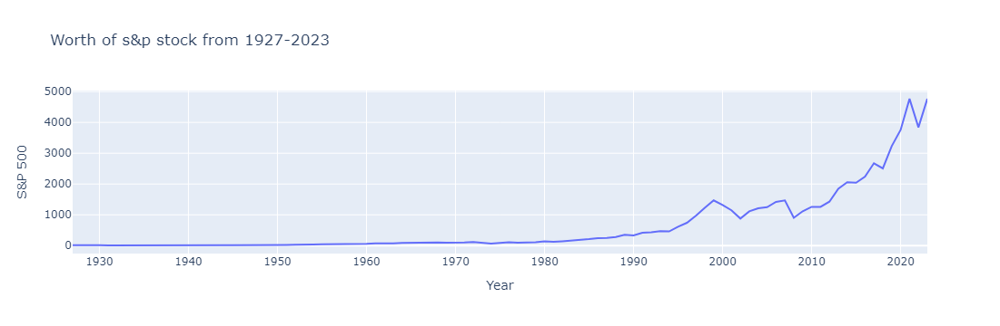

In [90]:
fig =px.line(SP,x="Year", y="S&P 500", title="Worth of s&p stock from 1927-2023")
fig.show()
            

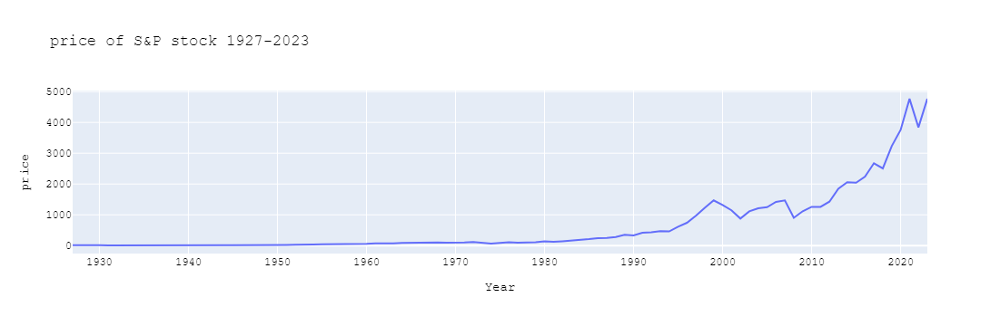

In [92]:
fig.update_layout(
    title="price of S&P stock 1927-2023",
    xaxis_title="Year",
    yaxis_title="price",
    font=dict(
        family="courier New",
        size=12,
        color="black")
)

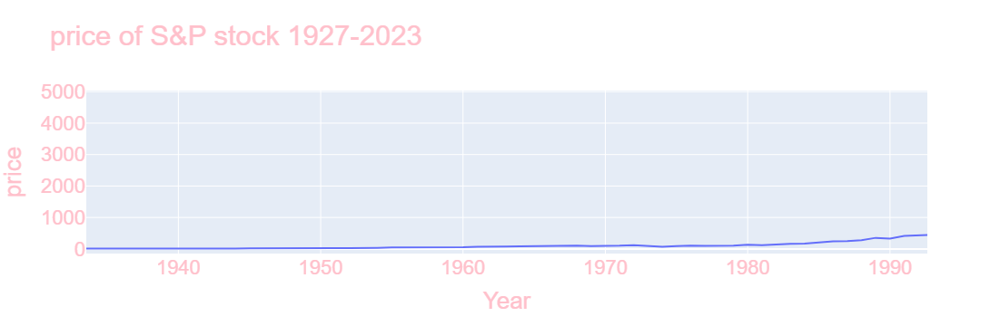

In [98]:
fig.update_layout(
    font=dict(
        family="Arial",
        size=22,
        color="pink"
    )
)

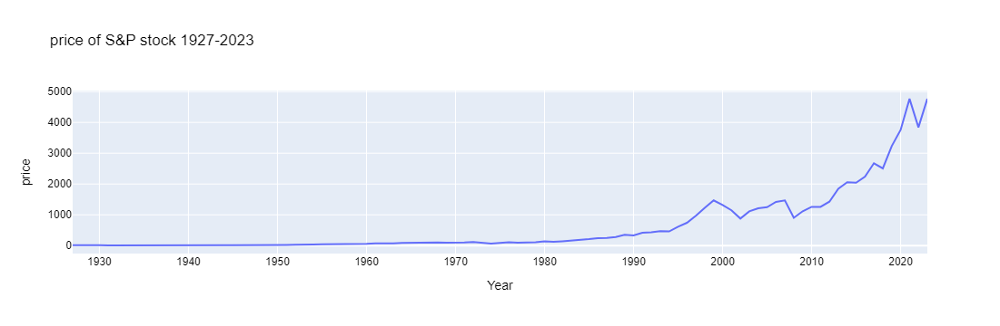

In [102]:
fig.update_layout(
    font=dict(
        family="Arial",
        size=12,
        color="black"
    )
)

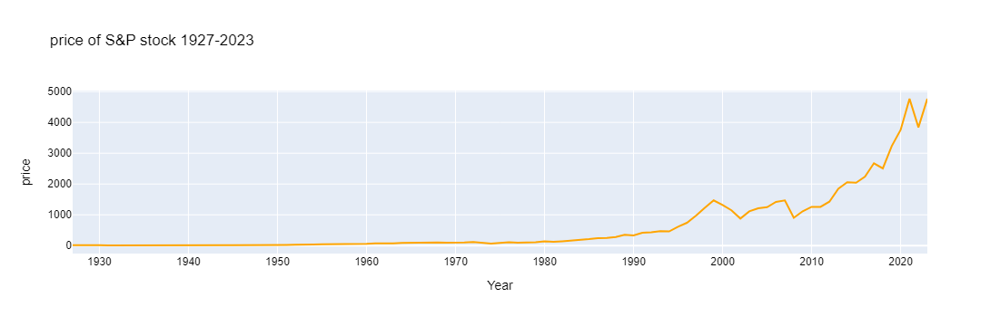

In [106]:
fig.update_traces(line_color="orange", selector=dict(type='scatter'))

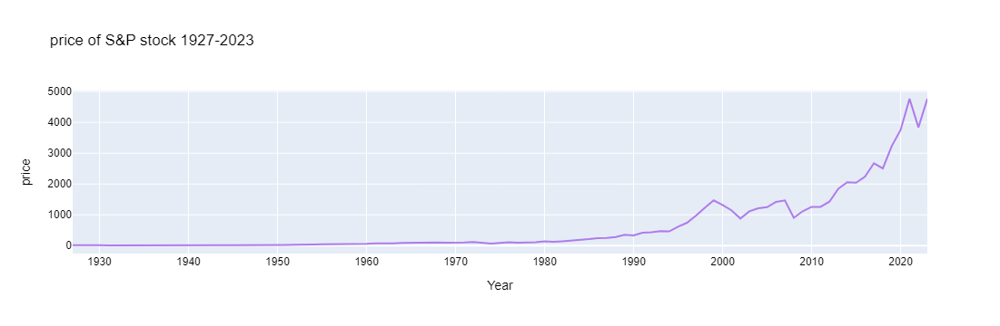

In [112]:
fig.update_traces(line_color="#AF7BED", selector=dict(type='scatter'))

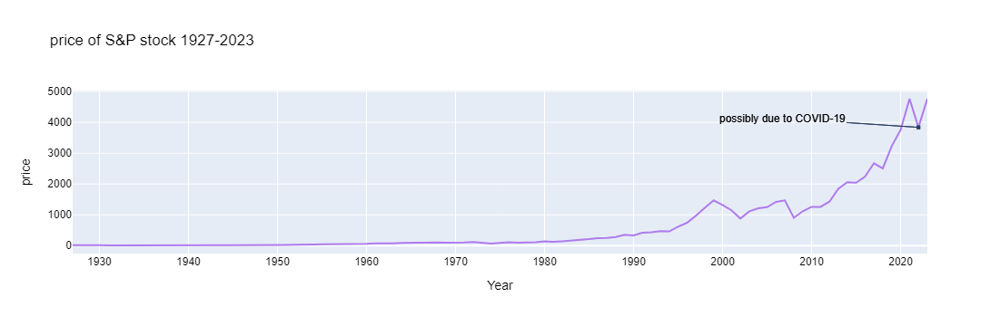

In [122]:
fig.add_annotation(
    x="2022",
    y=3839.5,
    text="possibly due to COVID-19",
    showarrow=True,
    arrowhead=7,
    ax=-150,
    ay=-10,
hovertext="COVID-19 was apandemic from 2020 until 2023 <br> This is me craeting a Third line",
hoverlabel=dict(
    bgcolor="White",
    bordercolor="black",
    font=dict(
        color="black"
    )
  )
)

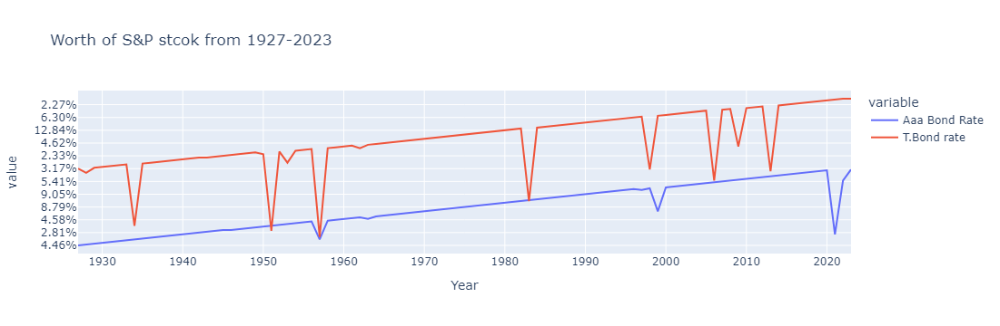

In [128]:
 fig = px.line(SP, x="Year", y=["Aaa Bond Rate", "T.Bond rate"], title="Worth of S&P stcok from 1927-2023")
fig.show()

## presentation4

In [19]:
import plotly.express as px
import pandas as pd

In [21]:
data=pd.read_csv('country_wise_latest.csv')
data.head()

,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
0,Afghanistan,36263,1269,25198,9796,106,10,18,3.50,69.49,5.04,35526,737,2.07,Eastern Mediterranean
1,Albania,4880,144,2745,1991,117,6,63,2.95,56.25,5.25,4171,709,17.00,Europe
2,Algeria,27973,1163,18837,7973,616,8,749,4.16,67.34,6.17,23691,4282,18.07,Africa
3,Andorra,907,52,803,52,10,0,0,5.73,88.53,6.48,884,23,2.60,Europe
4,Angola,950,41,242,667,18,1,0,4.32,25.47,16.94,749,201,26.84,Africa


In [23]:
data.describe()

,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase
count,1.870000e+02,187.000000,1.870000e+02,1.870000e+02,187.000000,187.000000,187.000000,187.000000,187.000000,187.00,1.870000e+02,187.000000,187.000000
mean,8.813094e+04,3497.518717,5.063148e+04,3.400194e+04,1222.957219,28.957219,933.812834,3.019519,64.820535,inf,7.868248e+04,9448.459893,13.606203
std,3.833187e+05,14100.002482,1.901882e+05,2.133262e+05,5710.374790,120.037173,4197.719635,3.454302,26.287694,NaN,3.382737e+05,47491.127684,24.509838
min,1.000000e+01,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,1.000000e+01,-47.000000,-3.840000
25%,1.114000e+03,18.500000,6.265000e+02,1.415000e+02,4.000000,0.000000,0.000000,0.945000,48.770000,1.45,1.051500e+03,49.000000,2.775000
50%,5.059000e+03,108.000000,2.815000e+03,1.600000e+03,49.000000,1.000000,22.000000,2.150000,71.320000,3.62,5.020000e+03,432.000000,6.890000
75%,4.046050e+04,734.000000,2.260600e+04,9.149000e+03,419.500000,6.000000,221.000000,3.875000,86.885000,6.44,3.708050e+04,3172.000000,16.855000
max,4.290259e+06,148011.000000,1.846641e+06,2.816444e+06,56336.000000,1076.000000,33728.000000,28.560000,100.000000,inf,3.834677e+06,455582.000000,226.320000


In [25]:
data.isnull().sum()

Country/Region            0
Confirmed                 0
Deaths                    0
Recovered                 0
Active                    0
New cases                 0
New deaths                0
New recovered             0
Deaths / 100 Cases        0
Recovered / 100 Cases     0
Deaths / 100 Recovered    0
Confirmed last week       0
1 week change             0
1 week % increase         0
WHO Region                0
dtype: int64

In [26]:
data.drop_duplicates()

,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
0,Afghanistan,36263,1269,25198,9796,106,10,18,3.50,69.49,5.04,35526,737,2.07,Eastern Mediterranean
1,Albania,4880,144,2745,1991,117,6,63,2.95,56.25,5.25,4171,709,17.00,Europe
2,Algeria,27973,1163,18837,7973,616,8,749,4.16,67.34,6.17,23691,4282,18.07,Africa
3,Andorra,907,52,803,52,10,0,0,5.73,88.53,6.48,884,23,2.60,Europe
4,Angola,950,41,242,667,18,1,0,4.32,25.47,16.94,749,201,26.84,Africa
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
182,West Bank and Gaza,10621,78,3752,6791,152,2,0,0.73,35.33,2.08,8916,1705,19.12,Eastern Mediterranean
183,Western Sahara,10,1,8,1,0,0,0,10.00,80.00,12.50,10,0,0.00,Africa
184,Yemen,1691,483,833,375,10,4,36,28.56,49.26,57.98,1619,72,4.45,Eastern Mediterranean
185,Zambia,4552,140,2815,1597,71,1,465,3.08,61.84,4.97,3326,1226,36.86,Africa


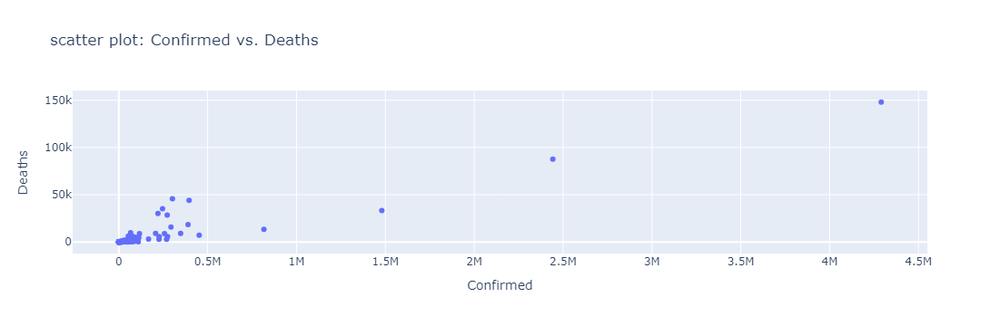

In [29]:
fig = px.scatter(data, x='Confirmed',
                 y = 'Deaths',
                 title = 'scatter plot: Confirmed vs. Deaths')
fig.show()

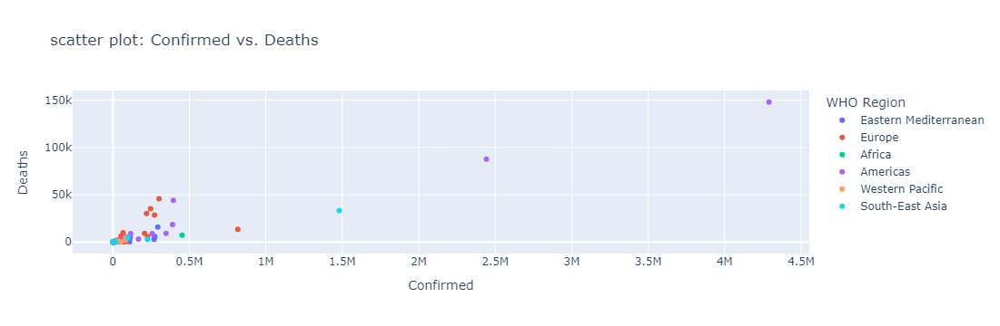

In [30]:
fig = px.scatter(data, x='Confirmed',
                 y = 'Deaths',
                 color='WHO Region',
                 title = 'scatter plot: Confirmed vs. Deaths')
fig.show()

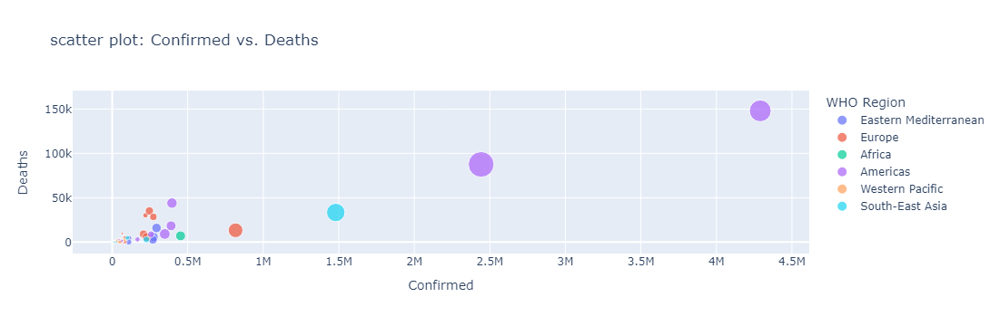

In [31]:
fig = px.scatter(data, x='Confirmed',
                 y = 'Deaths',
                 color='WHO Region',
                 size='Recovered',
                 title = 'scatter plot: Confirmed vs. Deaths')
fig.show()

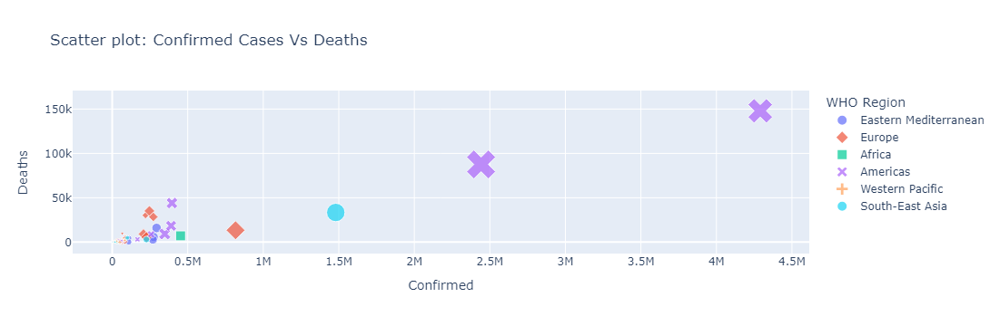

In [32]:
fig=px.scatter(data, x='Confirmed', y ='Deaths', color='WHO Region', size='Recovered', hover_data=['Country/Region','Active','New cases'], title ='Scatter plot: Confirmed Cases Vs Deaths', symbol='WHO Region')
fig.show()

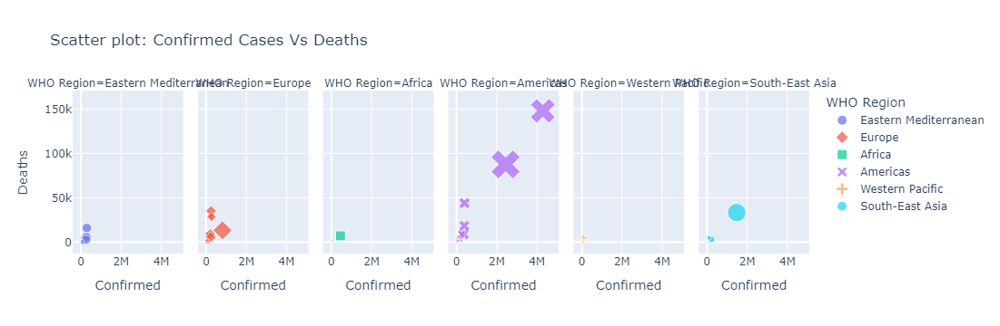

In [37]:
fig=px.scatter(data, x='Confirmed', y ='Deaths', color='WHO Region', size='Recovered', hover_data=['Country/Region','Active','New cases'], title ='Scatter plot: Confirmed Cases Vs Deaths', symbol='WHO Region', facet_col='WHO Region')
fig.show()

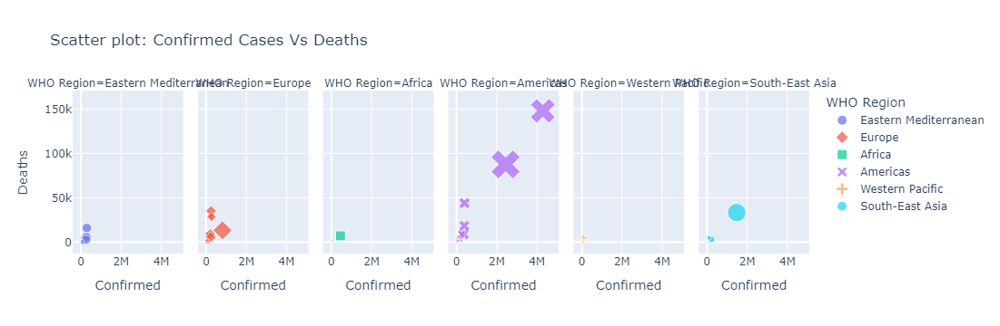

In [39]:
fig=px.scatter(data, x='Confirmed', y ='Deaths', color='WHO Region', size='Recovered', hover_data=['Country/Region','Active','New cases', 'Confirmed last week', '1 week change'], title ='Scatter plot: Confirmed Cases Vs Deaths', symbol='WHO Region', facet_col='WHO Region')
fig.show()